## November 23rd Work: Graphing Light Curves & Periods of Interesting Elliptic Binary System

In [1]:
!pip install lightkurve 

  Using cached lightkurve-2.3.0-py3-none-any.whl (259 kB)
  Using cached fbpca-1.0-py3-none-any.whl
  Using cached astropy-5.1.1-cp39-cp39-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (11.0 MB)
  Using cached memoization-0.4.0-py3-none-any.whl
  Using cached oktopus-0.1.2-py3-none-any.whl
  Using cached autograd-1.5-py3-none-any.whl (48 kB)
  Attempting uninstall: astropy
    Found existing installation: astropy 4.3.1
    Uninstalling astropy-4.3.1:
      Successfully uninstalled astropy-4.3.1


In [3]:
import lightkurve as lk
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from astropy.io import ascii

# If you want your figures to look nicer and larger
%config InlineBackend.figure_format = "retina"
from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["font.size"] = 20

In [4]:
data = ascii.read("EB_TESScat.ascii")

In [5]:
TESS_ID = data['TIC']
Periods = data['period']
Search_Indexes = np.where((Periods>8) & (Periods<12))

In [5]:
print(data)
print(len(Search_Indexes[0]))

   TIC       period  
---------- ----------
     91961  5.2826248
    101462  4.1739815
    120016  0.3263708
    627436  0.5789058
    737546  3.0677452
    927579  6.0705574
   1003831   1.651149
   1045298  1.4634139
   1103432  3.7260484
   1129033  1.3600996
       ...        ...
1102093577  0.2678155
1400770435 13.7432308
1551345500 47.3858687
1713419350  0.1296923
1883519478  7.6407461
1957912171  0.1185566
1981434198  0.3062443
1981621672  0.2783084
1992266045  6.6177363
2003333263   0.220418
2046417955  0.2358838
Length = 4583 rows
303


In [9]:
TESS_ID[303]

29478974

/tmp/ipykernel_151/377930392.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1, ncols=3, sharex=False, sharey=False, figsize=(25,5))


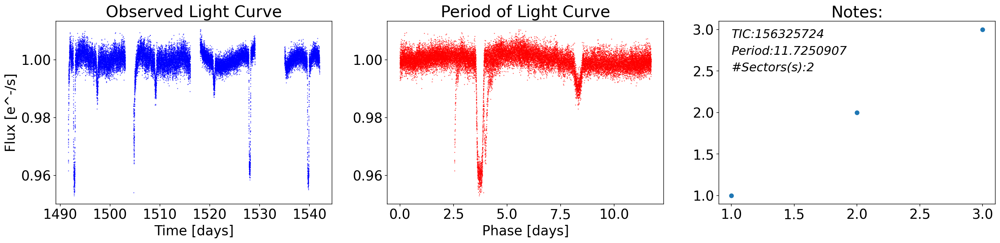

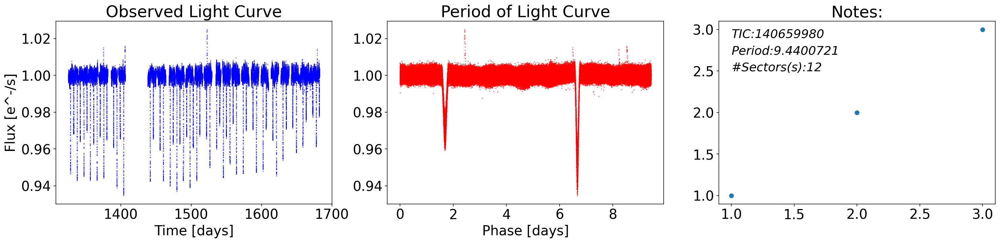

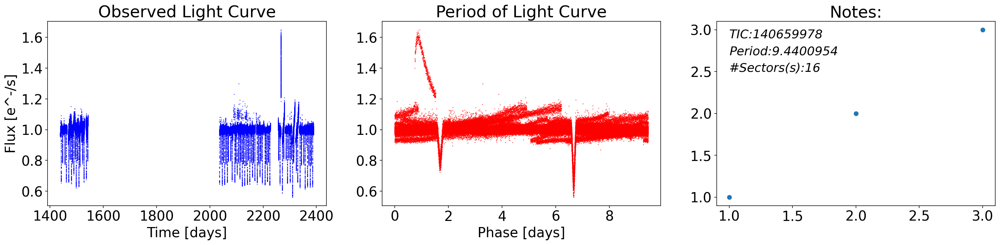

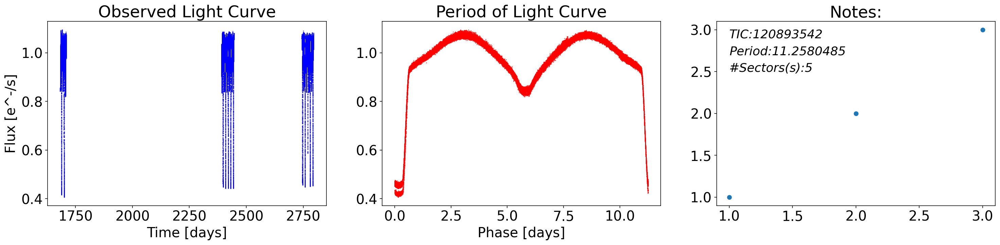

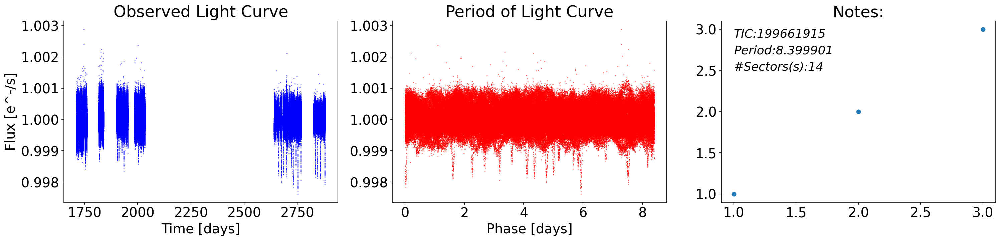

...

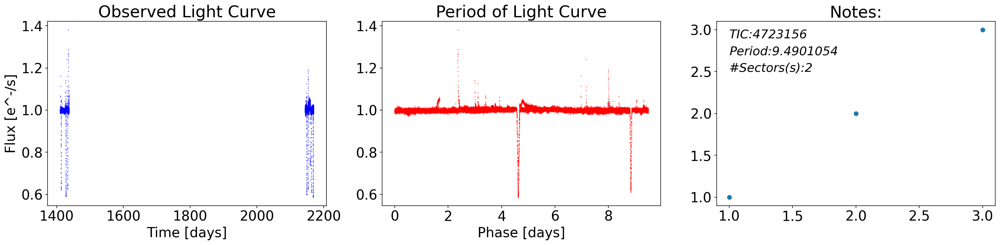

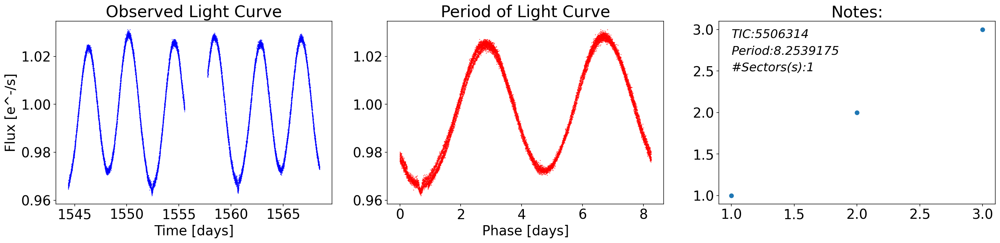

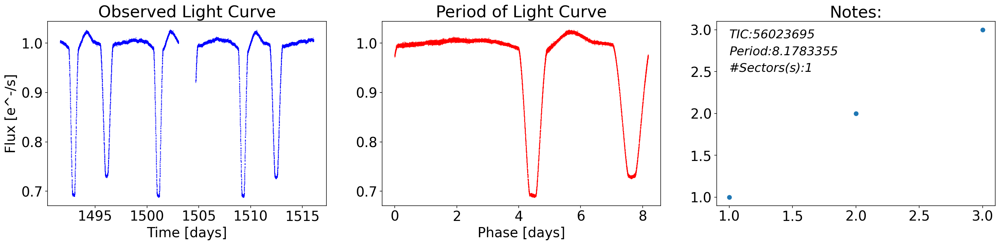

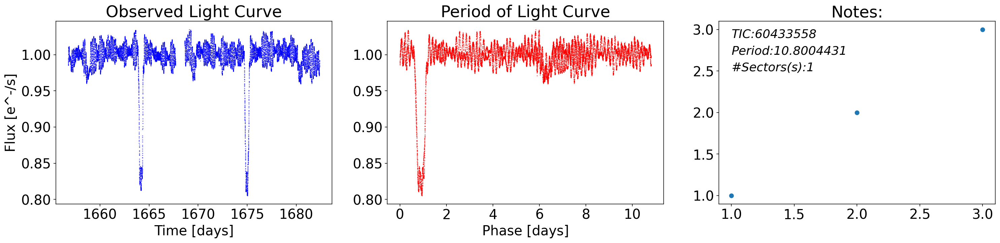

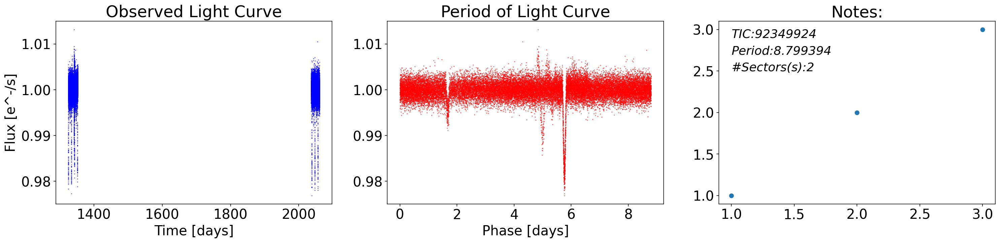

In [6]:
InterestingTESS = np.array([156325724, 140659980, 140659978, 120893542, 199661915, 200373531, 207398432, 213047427, 233569141, 252554485, 259070502, 269347089, 285392907, 306955469, 306956190, 308991822, 313028417, 316182273, 355152971, 362103921, 37248140, 380783252, 381009148, 382028425, 382308684, 389070884, 396059992, 436863045, 443174527, 33890224, 452500843, 455991789, 459758530, 464772659, 4723156, 5506314, 56023695, 60433558, 92349924])

for i in InterestingTESS:

    Search_Indexes = np.where((Periods>8) & (Periods<12) & (TESS_ID==i))
    for p, _id in zip(Periods[Search_Indexes], TESS_ID[Search_Indexes]):
        search_result = lk.search_lightcurve(f'TIC {_id}',author="SPOC",exptime=120)

        mission = search_result.mission
        exposure = search_result.exptime

        list_lc = search_result.download_all()

        flux, time = [], [] #Empty lists with flux (or brightness) & time

        for lc in list_lc: #We are going through each light curve and calling it list_lc
                lc = lc.remove_nans() #Removed "empty" or "unavailable" results
                lc = lc.normalize() # normalize light curve - we are saying take all the sectors and make sure they are on the same scale of brightness (electronics can change background noise but for light)
                t, f = lc['time'], lc['flux'] #We are going through each light curve and extracting the time and flux
                flux.append(f.unmasked.value) #Give me all the fluxes that have values (so nans didn't remove all empty data)
                time.append(t.value) #We are appending the time to the empty time list

        master_time = np.concatenate(time) #Stitches them all together
        master_flux = np.concatenate(flux) #Stitches them all together 

        fig, ax = plt.subplots(nrows=1, ncols=3, sharex=False, sharey=False, figsize=(25,5))
        ax[0].scatter(master_time, master_flux, color='blue', s=0.1)
        ax[0].set_title("Observed Light Curve") #OLC stands for Observed Light Curve, P = Period
        ax[0].set_xlabel("Time [days]")
        ax[0].set_ylabel("Flux [e^-/s]")
        #ax[0].legend((f"Period:{p}", f"#Sectors(s):{len(mission)}"), loc='lower right', shadow=True)

        ax[1].scatter(master_time%p, master_flux, color='red', s=0.1)
        ax[1].set_title("Period of Light Curve") #PLC stands for Folded Period for Light Curve, P = Period
        ax[1].set_xlabel("Phase [days]")
        #ax[1].set_ylabel("Flux [e^-/s]")
        #ax[1].legend([line1, line2],[f"Period:{p}", f"#Sector(s):{len(mission)}"], loc='lower right', shadow=True)

        x=[1,2,3]
        y=[1,2,3]
        ax[2].scatter(x,y)
        ax[2].set_title("Notes:") #PLC stands for Folded Period for Light Curve, P = Period
        ax[2].text(1, 2.9, f'TIC:{_id}', fontsize=18, style='oblique')
        ax[2].text(1, 2.7, f'Period:{p}', fontsize=18, style='oblique')
        ax[2].text(1, 2.5, f'#Sectors(s):{len(mission)}', fontsize=18, style='oblique')
    

In [128]:
# Attempted to make a function...def PlotsForTessID(InputTessID):
InterestingTESS = np.array([156325724, 140659980, 140659978, 120893542, 199661915, 200373531, 207398432, 213047427, 233569141, 252554485, 259070502, 269347089, 285392907, 306955469, 306956190, 308991822, 313028417, 316182273, 355152971, 362103921, 37248140, 380783252, 381009148, 382028425, 382308684, 389070884, 396059992, 436863045, 443174527, 33890224, 452500843, 455991789, 459758530, 464772659, 4723156, 5506314, 56023695, 60433558, 92349924])

#Attempting to fix the indexing error so I can get ALL these graphs plotted. Ask about tomorrow because I could not solve it tonight.
Search_Indexes = np.where((Periods>8) & (Periods<12))
Search_Indexes2 = (TESS_ID, [InterestingTESS])
for p, _id in zip(Periods[Search_Indexes], TESS_ID[InterestingTESS]):
    search_result = lk.search_lightcurve(f'TIC {_id}',author="SPOC",exptime=120)
    
    mission = search_result.mission
    exposure = search_result.exptime
    
    list_lc = search_result.download_all()
    
    flux, time = [], [] #Empty lists with flux (or brightness) & time
        
    for lc in list_lc: #We are going through each light curve and calling it list_lc
            lc = lc.remove_nans() #Removed "empty" or "unavailable" results
            lc = lc.normalize() # normalize light curve - we are saying take all the sectors and make sure they are on the same scale of brightness (electronics can change background noise but for light)
            t, f = lc['time'], lc['flux'] #We are going through each light curve and extracting the time and flux
            flux.append(f.unmasked.value) #Give me all the fluxes that have values (so nans didn't remove all empty data)
            time.append(t.value) #We are appending the time to the empty time list

    master_time = np.concatenate(time) #Stitches them all together
    master_flux = np.concatenate(flux) #Stitches them all together 
    
    fig, ax = plt.subplots(nrows=1, ncols=3, sharex=False, sharey=False, figsize=(15,5))
    ax[0].scatter(master_time, master_flux, color='blue', s=0.1)
    ax[0].set_title("Observed Light Curve") #OLC stands for Observed Light Curve, P = Period
    ax[0].set_xlabel("Time [days]")
    ax[0].set_ylabel("Flux [e^-/s]")
    #ax[0].legend((f"Period:{p}", f"#Sectors(s):{len(mission)}"), loc='lower right', shadow=True)
    
    ax[1].scatter(master_time%p, master_flux, color='red', s=0.1)
    ax[1].set_title("Period of Light Curve") #PLC stands for Folded Period for Light Curve, P = Period
    ax[1].set_xlabel("Phase [days]")
    #ax[1].set_ylabel("Flux [e^-/s]")
    #ax[1].legend([line1, line2],[f"Period:{p}", f"#Sector(s):{len(mission)}"], loc='lower right', shadow=True)
    
    ax[2].scatter(x,y)
    ax[2].set_title("Notes:") #PLC stands for Folded Period for Light Curve, P = Period
    ax[2].text(1, 2.9, f'TIC:{_id}', fontsize=18, style='oblique')
    ax[2].text(1, 2.7, f'Period:{p}', fontsize=18, style='oblique')
    ax[2].text(1, 2.5, f'#Sectors(s):{len(mission)}', fontsize=18, style='oblique')
    

IndexError: index 156325724 is out of bounds for axis 0 with size 4583

23.039883226584607
26.588983855071547
27.1622671756636


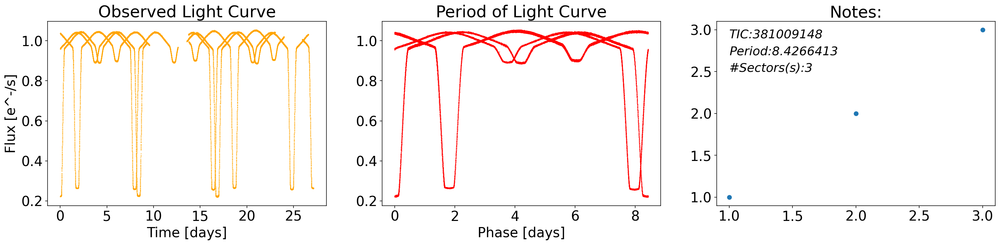

In [33]:
#Experimenting...to make the light curves more readable
InterestingTESS = np.array([156325724, 140659980, 140659978, 120893542, 199661915, 200373531, 207398432, 213047427, 233569141, 252554485, 259070502, 269347089, 285392907, 306955469, 306956190, 308991822, 313028417, 316182273, 355152971, 362103921, 37248140, 380783252, 381009148, 382028425, 382308684, 389070884, 396059992, 436863045, 443174527, 33890224, 452500843, 455991789, 459758530, 464772659, 4723156, 5506314, 56023695, 60433558, 92349924])
clr = ['red', 'blue', 'green', 'orange', 'mediumpurple', 'cyan']
#for i in InterestingTESS:

Search_Indexes = np.where((Periods>8) & (Periods<12) & (TESS_ID==381009148))
for p, _id in zip(Periods[Search_Indexes], TESS_ID[Search_Indexes]):
    search_result = lk.search_lightcurve(f'TIC {_id}',author="SPOC",exptime=120)

    mission = search_result.mission
    exposure = search_result.exptime

    list_lc = search_result.download_all()

    flux, time = [], [] #Empty lists with flux (or brightness) & time

    for lc in list_lc: #We are going through each light curve and calling it list_lc
            lc = lc.remove_nans() #Removed "empty" or "unavailable" results
            lc = lc.normalize() # normalize light curve - we are saying take all the sectors and make sure they are on the same scale of brightness (electronics can change background noise but for light)
            t, f = lc['time'], lc['flux'] #We are going through each light curve and extracting the time and flux
            #time.append([0])
            #time.append([1])
            t = t - min(t)
            #plt.scatter(t.value,f.unmasked.value) This gives us 
            #t = t - (time[-1])
            flux.append(f.unmasked.value) #Give me all the fluxes that have values (so nans didn't remove all empty data)
            time.append(t.value) #We are appending the time to the empty time list
            print(max(t.value))

    master_time = np.concatenate(time) #Stitches them all together
    master_flux = np.concatenate(flux) #Stitches them all together 

    fig, ax = plt.subplots(nrows=1, ncols=3, sharex=False, sharey=False, figsize=(25,5))
    ax[0].scatter(master_time, master_flux, color=clr[np.random.randint(0, 5)], s=0.1)
    #ax[0].set_xscale('log') Didn't work.
    ax[0].set_title("Observed Light Curve") #OLC stands for Observed Light Curve, P = Period
    ax[0].set_xlabel("Time [days]")
    ax[0].set_ylabel("Flux [e^-/s]")
    #ax[0].legend((f"Period:{p}", f"#Sectors(s):{len(mission)}"), loc='lower right', shadow=True)

    ax[1].scatter(master_time%p, master_flux, color='red', s=0.1)
    ax[1].set_title("Period of Light Curve") #PLC stands for Folded Period for Light Curve, P = Period
    ax[1].set_xlabel("Phase [days]")
    #ax[1].set_ylabel("Flux [e^-/s]")
    #ax[1].legend([line1, line2],[f"Period:{p}", f"#Sector(s):{len(mission)}"], loc='lower right', shadow=True)

    x=[1,2,3]
    y=[1,2,3]
    ax[2].scatter(x,y)
    ax[2].set_title("Notes:") #PLC stands for Folded Period for Light Curve, P = Period
    ax[2].text(1, 2.9, f'TIC:{_id}', fontsize=18, style='oblique')
    ax[2].text(1, 2.7, f'Period:{p}', fontsize=18, style='oblique')
    ax[2].text(1, 2.5, f'#Sectors(s):{len(mission)}', fontsize=18, style='oblique')

In [13]:
tpf = lk.search_targetpixelfile("TIC 156325724")[0]
tpf = tpf.download()
tpf.interact()

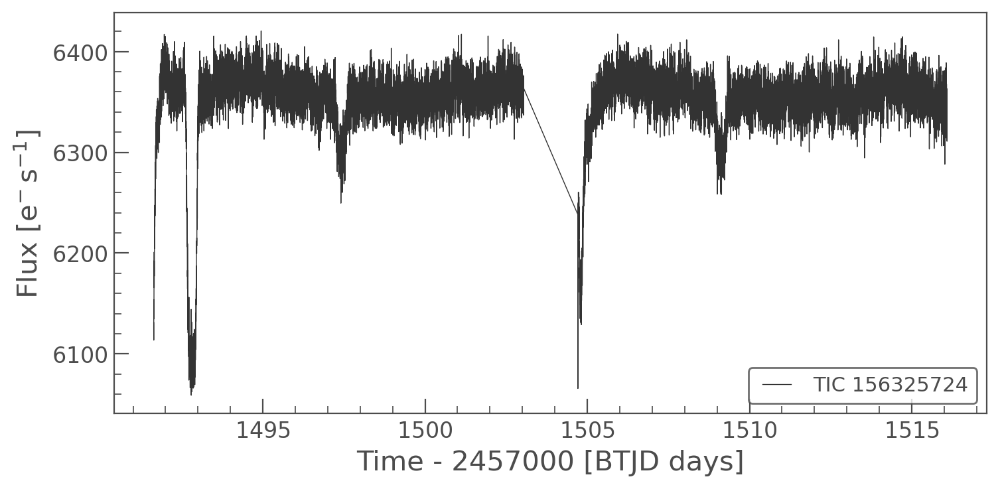

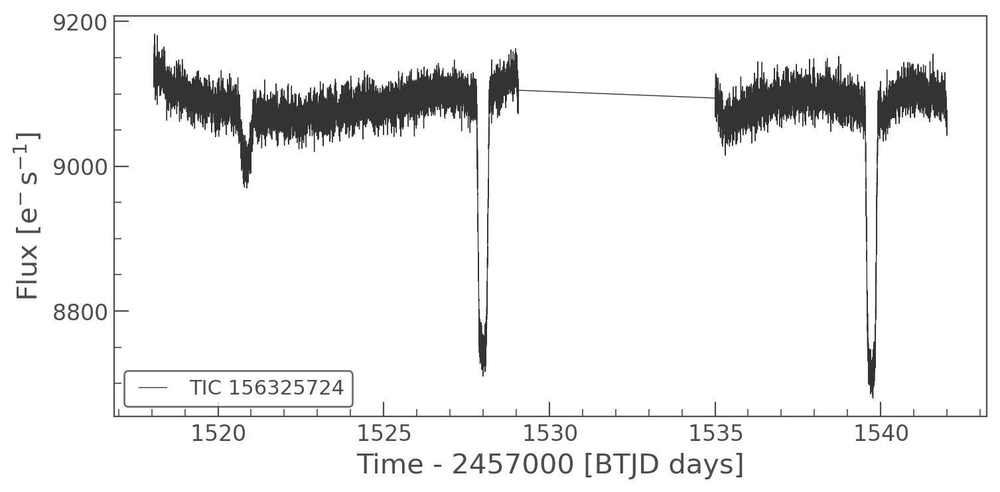

In [14]:
#How to just pull out a light curve from sector to sector:
for i in range(2):
    lc = lk.search_lightcurve("TIC 156325724",author="SPOC")[i].download()
    lc.plot()

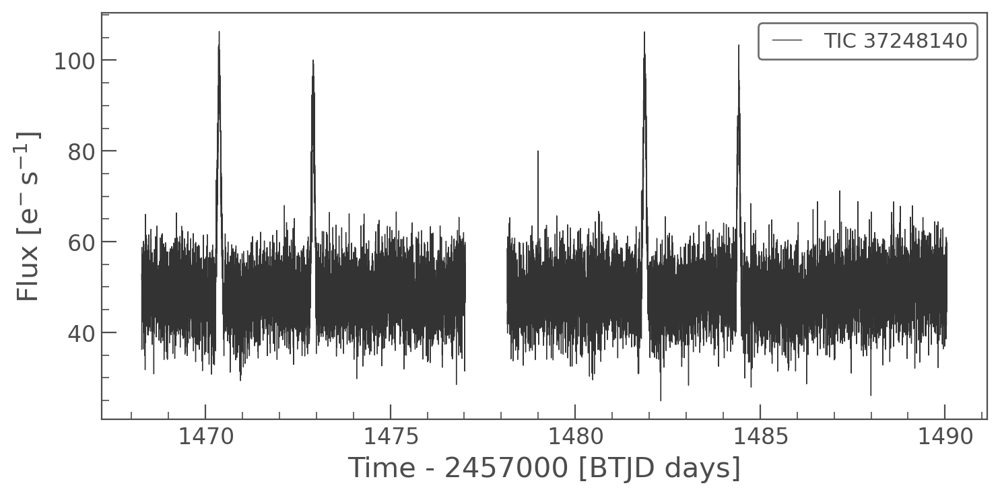

In [12]:
for i in range(1): #Inside range refers to how many sectors
    lc = lk.search_lightcurve("TIC 37248140", author="SPOC")[i].download()
    lc.plot()
    
#Query this to see the time between jumps in light...black hole amplification is less of a jump than is portrayed here. The time, visually is about 3 days.